# HOG+SVM

##Install and import Required packages

In [1]:
# Install the official kagglehub package
!pip install kagglehub -q

import kagglehub
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from sklearn.model_selection import train_test_split

##Data Loading

In [2]:
# Download Kaggle dataset using kagglehub
print("Downloading Kaggle Sheep UAV Dataset with kagglehub...")
path = kagglehub.dataset_download("bjosttveit/sheep-uav-yolo")
print(f"Dataset downloaded to: {path}")

# Load Roboflow Dataset
print("Loading Roboflow dataset...")

from google.colab import files
from google.colab import drive
import zipfile
import shutil

drive.mount('/content/drive')

drive_zip_path = "/content/drive/MyDrive/IPPR/aerial-sheep.zip"

if os.path.exists(drive_zip_path):
    shutil.copy(drive_zip_path, "./roboflow.zip")
    with zipfile.ZipFile("./roboflow.zip", 'r') as zip_ref:
        zip_ref.extractall('roboflow-sheep')
    print("Roboflow dataset extracted!")
else:
    print("Roboflow not found")


Using Colab cache for faster access to the 'sheep-uav-yolo' dataset.
Dataset downloaded to: /kaggle/input/sheep-uav-yolo
Loading Roboflow dataset...
Mounted at /content/drive
Roboflow dataset extracted!


In [3]:
# The path from kagglehub contains the dataset
kaggle_images = glob.glob(os.path.join(path, '**', '*.jpg'), recursive=True)
kaggle_images += glob.glob(os.path.join(path, '**', '*.png'), recursive=True)

# Roboflow images
roboflow_images = glob.glob('roboflow-sheep/**/*.jpg', recursive=True)
roboflow_images += glob.glob('roboflow-sheep/**/*.png', recursive=True)

print(f"Image Loaded: {len(kaggle_images)} Kaggle, {len(roboflow_images)} Roboflow images")

Image Loaded: 1964 Kaggle, 4133 Roboflow images



 Kaggle Sheep UAV Dataset Samples (6 total images):


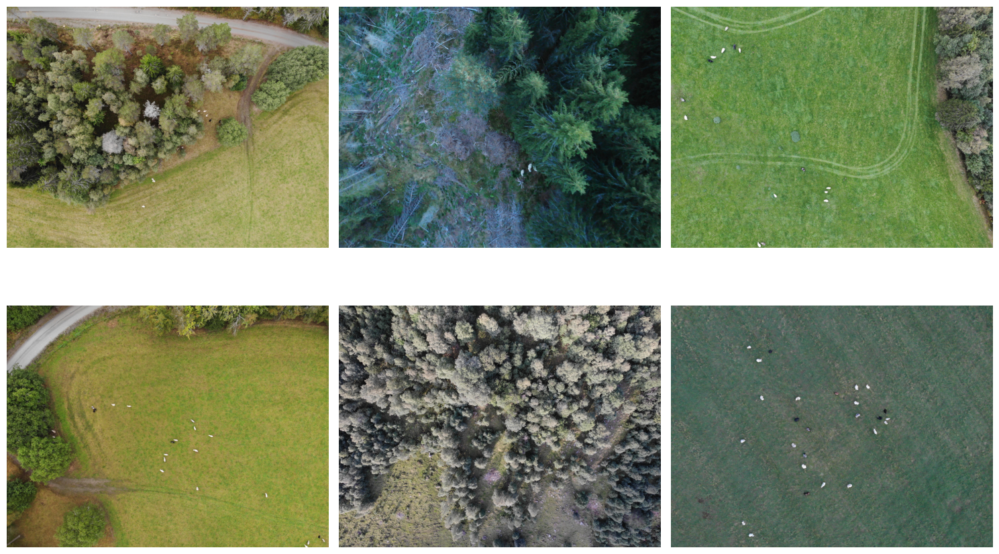


 Roboflow Aerial Sheep Dataset Samples (6 total images):


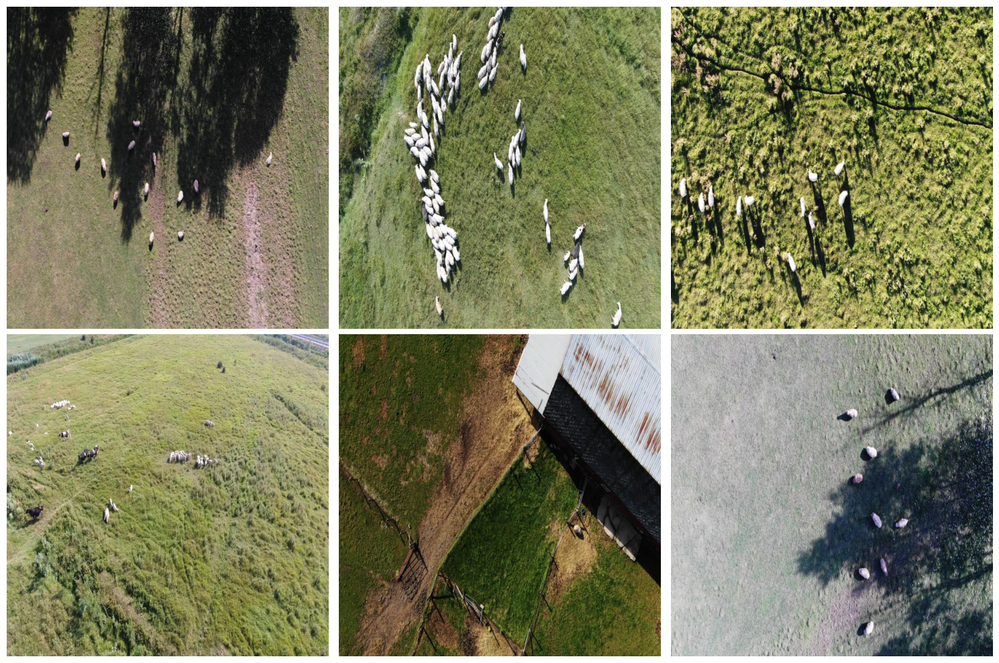

In [4]:
def visualize_dataset_samples(images, dataset_name, num_samples=6):
    """Visualize samples from a dataset with their annotations"""
    print(f"\n {dataset_name} Dataset Samples ({len(images)} total images):")

    # Create subplot
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    samples_to_show = min(num_samples, len(images))

    for i in range(samples_to_show):
        img_path = images[i]
        img = cv2.imread(img_path)

        if img is not None:
            # Convert BGR to RGB for matplotlib
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Draw image
            axes[i].imshow(img_rgb)
            axes[i].axis('off')

        else:
            axes[i].set_title(f"Failed to load\n{os.path.basename(img_path)}", fontsize=10)
            axes[i].axis('off')

    # Hide any unused subplots
    for i in range(samples_to_show, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

# Visualize Kaggle dataset immediately
visualize_dataset_samples(kaggle_images[:6], "Kaggle Sheep UAV")

# Visualize Roboflow dataset if available
if roboflow_images:
    visualize_dataset_samples(roboflow_images[:6], "Roboflow Aerial Sheep")
else:
    print("\nNo Roboflow images to visualize")

##Data Preprocessing

Roboflow dataset is used for Tier 1 (training, validation, testing) and Kaggle dataset will be used for Tier 2 testing.

###Data Splitting

In [5]:
print("Creating dataset splits")

# Split Roboflow sheep images first (70/15/15)
train_images, temp_images = train_test_split(roboflow_images, test_size=0.3, random_state=42)
val_images, test_images = train_test_split(temp_images, test_size=0.5, random_state=42)

print(f"Dataset splits created:")
print(f"   Training images: {len(train_images)}")
print(f"   Validation images: {len(val_images)}")
print(f"   Test images: {len(test_images)}")

# Kaggle images are kept separate for Tier 2 testing
print(f"   Kaggle test images: {len(kaggle_images)}")

Creating dataset splits
Dataset splits created:
   Training images: 2893
   Validation images: 620
   Test images: 620
   Kaggle test images: 1964


###Image Preprocessing

In [6]:
def resize_with_padding(image, target_size=(512, 512)):
    """Resize image while preserving aspect ratio"""
    h, w = image.shape[:2]
    scale = min(target_size[0]/h, target_size[1]/w)
    new_h, new_w = int(h * scale), int(w * scale)

    resized = cv2.resize(image, (new_w, new_h))

    # Create padded image
    padded = np.zeros((target_size[0], target_size[1], 3), dtype=np.uint8)
    y_offset = (target_size[0] - new_h) // 2
    x_offset = (target_size[1] - new_w) // 2
    padded[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized

    return padded

def apply_clahe_enhancement(image):
    """Apply CLAHE contrast enhancement"""
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(32, 32))
    v_enhanced = clahe.apply(v)

    hsv_enhanced = cv2.merge([h, s, v_enhanced])
    return cv2.cvtColor(hsv_enhanced, cv2.COLOR_HSV2BGR)

def reduce_noise(image):
    """Apply noise reduction"""
    return cv2.GaussianBlur(image, (3, 3), 0)

def sharpen_image(image):
    """Apply sharpening filter"""
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    return cv2.filter2D(image, -1, kernel)

def full_image_preprocessing(image, target_size=(512, 512)):
    """Complete image preprocessing pipeline"""
    image = resize_with_padding(image, target_size)
    image = apply_clahe_enhancement(image)
    image = reduce_noise(image)
    image = sharpen_image(image)
    return image

print("Image Preprocessing Functions - Ready")

Image Preprocessing Functions - Ready


VISUALIZING PREPROCESSING STEPS
Original image: (600, 600, 3)


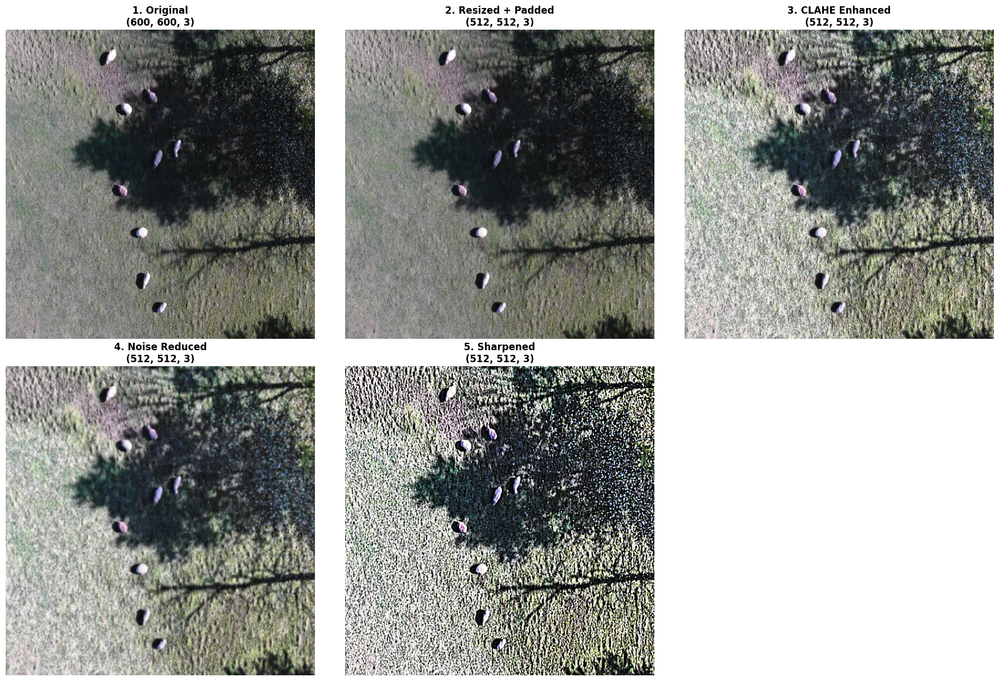

In [7]:
print("VISUALIZING PREPROCESSING STEPS")

def visualize_preprocessing_steps(image_path):
    """Show before/after for each preprocessing step"""

    # Load original image
    original = cv2.imread(image_path)
    if original is None:
        print(f"Could not load image: {image_path}")
        return

    print(f"Original image: {original.shape}")

    # Apply each step and store results
    steps = []
    step_names = []

    # Step 1: Original
    steps.append(original)
    step_names.append("1. Original")

    # Step 2: Resize with Padding
    resized = resize_with_padding(original, (512, 512))
    steps.append(resized)
    step_names.append("2. Resized + Padded")

    # Step 3: CLAHE Enhancement
    clahe = apply_clahe_enhancement(resized)
    steps.append(clahe)
    step_names.append("3. CLAHE Enhanced")

    # Step 4: Noise Reduction
    denoised = reduce_noise(clahe)
    steps.append(denoised)
    step_names.append("4. Noise Reduced")

    # Step 5: Sharpening
    sharpened = sharpen_image(denoised)
    steps.append(sharpened)
    step_names.append("5. Sharpened")

    # Display all steps
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()

    for i, (img, name) in enumerate(zip(steps, step_names)):
        display_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(display_img)
        axes[i].set_title(f"{name}\n{img.shape}", fontsize=12, fontweight='bold')
        axes[i].axis('off')

    # Hide unused subplots
    for i in range(len(steps), len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

# Test on a sample image
if len(train_images) > 0:
    visualize_preprocessing_steps(train_images[0])

###Annotation & Patch Extraction

In [8]:
import random

def get_annotation_path(image_path):
    # Get annotation file path from image path using YOLO format annotations
    return image_path.replace('images', 'labels').replace('.jpg', '.txt').replace('.png', '.txt')

def extract_patches_from_dataset(image_paths, patch_size=(128, 128), max_patches=5):
    """
    Extract positive (sheep) and negative (background) patches
    """
    positive_patches = []
    negative_patches = []

    print(f"Extracting patches from {len(image_paths)} images...")

    for img_path in tqdm(image_paths, desc="Processing images"):
        # Load image and annotations
        img = cv2.imread(img_path)
        ann_path = get_annotation_path(img_path)

        if img is None or not os.path.exists(ann_path):
            continue

        # Preprocess image
        img_processed = full_image_preprocessing(img, target_size=(512, 512))
        h, w = img_processed.shape[:2]

        # Read annotations
        with open(ann_path, 'r') as f:
            annotations = f.readlines()

        sheep_boxes = []

        # Extract POSITIVE patches (sheep)
        for ann in annotations[:max_patches]:
            parts = ann.strip().split()
            if len(parts) == 5:
                # Convert YOLO to pixel coordinates
                x_center = float(parts[1]) * w
                y_center = float(parts[2]) * h
                width = float(parts[3]) * w
                height = float(parts[4]) * h

                x1 = max(0, int(x_center - width/2))
                y1 = max(0, int(y_center - height/2))
                x2 = min(w, int(x_center + width/2))
                y2 = min(h, int(y_center + height/2))

                if (x2 - x1) >= 20 and (y2 - y1) >= 20:
                    sheep_boxes.append((x1, y1, x2, y2))

                    # Extract and resize patch
                    patch = img_processed[y1:y2, x1:x2]
                    if patch.size > 0:
                        patch_resized = cv2.resize(patch, patch_size)
                        positive_patches.append(patch_resized)

        # Extract NEGATIVE patches (background)
        for _ in range(max_patches):
            for attempt in range(50):
                x1 = random.randint(0, w - patch_size[0])
                y1 = random.randint(0, h - patch_size[1])
                x2 = x1 + patch_size[0]
                y2 = y1 + patch_size[1]

                # Avoid sheep areas
                overlap = False
                for sx1, sy1, sx2, sy2 in sheep_boxes:
                    if not (x2 < sx1 or x1 > sx2 or y2 < sy1 or y1 > sy2):
                        overlap = True
                        break

                if not overlap:
                    patch = img_processed[y1:y2, x1:x2]
                    if patch.shape[:2] == patch_size:
                        negative_patches.append(patch)
                        break

    print(f"Extracted {len(positive_patches)} sheep patches, {len(negative_patches)} background patches")
    return positive_patches, negative_patches

print("Patch Extraction - Ready")

Patch Extraction - Ready



VISUALIZING PATCH EXTRACTION
Found 9 sheep in img_530_jpg.rf.e88f79075b1da2de34eeae3ed36ea14e.jpg


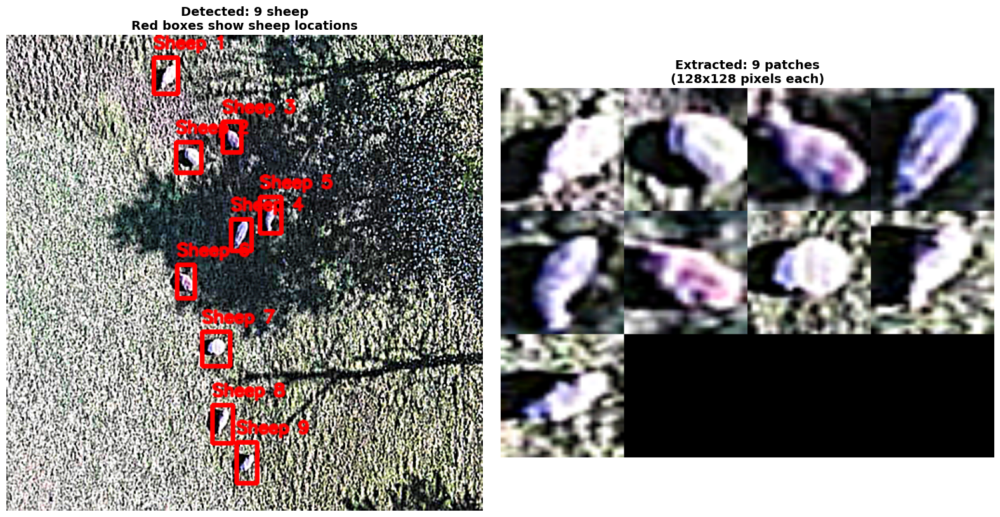

Extracted 9 patches


In [9]:
print("\nVISUALIZING PATCH EXTRACTION")

def visualize_patch_extraction(image_path):
    """Show patch extraction process"""

    img = cv2.imread(image_path)
    if img is None:
        return

    ann_path = get_annotation_path(image_path)
    if not os.path.exists(ann_path):
        return

    # Process image
    img_processed = full_image_preprocessing(img, target_size=(512, 512))
    img_display = img_processed.copy()

    h, w = img_processed.shape[:2]

    # Read annotations
    with open(ann_path, 'r') as f:
        annotations = f.readlines()

    print(f"Found {len(annotations)} sheep in {os.path.basename(image_path)}")

    # Extract and visualize patches
    patches = []
    for i, ann in enumerate(annotations):
        parts = ann.strip().split()
        if len(parts) == 5:
            # Convert to pixel coordinates
            x_center = float(parts[1]) * w
            y_center = float(parts[2]) * h
            width = float(parts[3]) * w
            height = float(parts[4]) * h

            x1 = max(0, int(x_center - width/2))
            y1 = max(0, int(y_center - height/2))
            x2 = min(w, int(x_center + width/2))
            y2 = min(h, int(y_center + height/2))

            # Draw bounding box
            cv2.rectangle(img_display, (x1, y1), (x2, y2), (0, 0, 255), 3)
            cv2.putText(
                img_display,
                f"Sheep {i+1}",
                (x1, y1 - 10),  # position: slightly above the top-left corner
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,            # text scale
                (0, 0, 255),# white text color
                2,              # thickness
                cv2.LINE_AA
            )

            # Extract patch
            patch = img_processed[y1:y2, x1:x2]
            if patch.size > 0 and patch.shape[0] > 10 and patch.shape[1] > 10:
                patch_resized = cv2.resize(patch, (128, 128))
                patches.append(patch_resized)

    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Annotated image
    axes[0].imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Detected: {len(annotations)} sheep\nRed boxes show sheep locations',
                     fontsize=14, fontweight='bold')
    axes[0].axis('off')

    # Extracted patches
    if patches:
        # Create grid
        cols = min(4, len(patches))
        rows = (len(patches) + cols - 1) // cols
        grid = np.zeros((128*rows, 128*cols, 3), dtype=np.uint8)

        for i, patch in enumerate(patches):
            row = i // cols
            col = i % cols
            grid[row*128:(row+1)*128, col*128:(col+1)*128] = patch

        axes[1].imshow(cv2.cvtColor(grid, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'Extracted: {len(patches)} patches\n(128x128 pixels each)',
                         fontsize=14, fontweight='bold')
        axes[1].axis('off')
    else:
        axes[1].text(0.5, 0.5, 'No patches extracted\n(Sheep too small)',
                    ha='center', va='center', transform=axes[1].transAxes,
                    fontsize=12, fontweight='bold')
        axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Extracted {len(patches)} patches")
    return patches

# Test patch extraction
if len(train_images) > 0:
    patches = visualize_patch_extraction(train_images[0])

###Patch Normalisation & Augmentation

In [10]:
def normalize_patch(patch):
    # Convert patch to grayscale and normalize to 0-1
    if len(patch.shape) == 3:
        gray = cv2.cvtColor(patch, cv2.COLOR_BGR2GRAY)
    else:
        gray = patch
    return gray.astype(np.float32) / 255.0

def augment_patches(patches, augmentation_factor=2):
    # Apply data augmentation to patches
    if not patches:
        return patches

    augmented = patches.copy()

    for patch in patches:
        for _ in range(augmentation_factor):
            aug_type = random.choice(['flip', 'brightness', 'rotation'])

            try:
                if aug_type == 'flip':
                    augmented.append(cv2.flip(patch, 1))
                elif aug_type == 'brightness':
                    alpha = random.uniform(0.7, 1.3)
                    augmented.append(cv2.convertScaleAbs(patch, alpha=alpha))
                elif aug_type == 'rotation':
                    h, w = patch.shape[:2]
                    angle = random.uniform(-15, 15)
                    center = (w//2, h//2)
                    M = cv2.getRotationMatrix2D(center, angle, 1.0)
                    augmented.append(cv2.warpAffine(patch, M, (w, h)))
            except:
                continue

    return augmented

print("Normalization & Augmentation - Ready")

Normalization & Augmentation - Ready



VISUALIZING PATCH NORMALIZATION


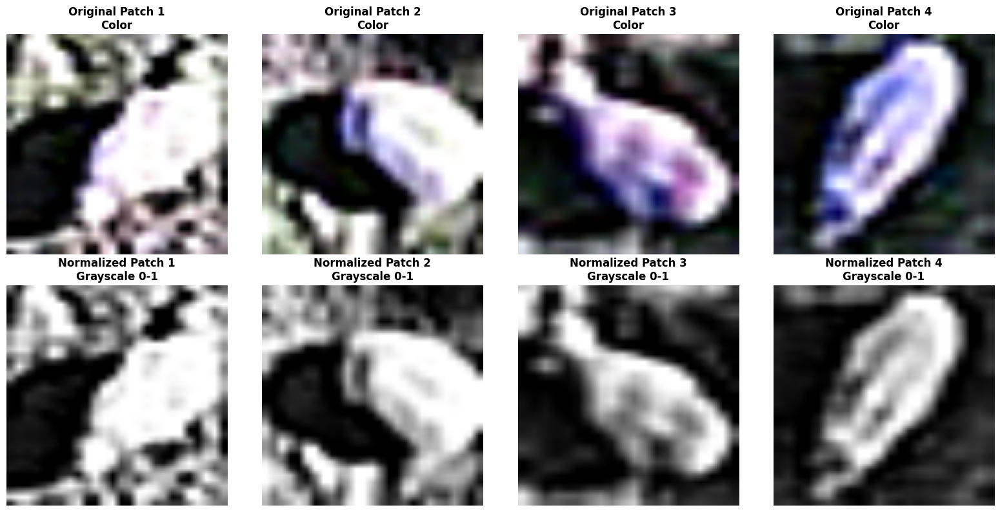

In [11]:
print("\nVISUALIZING PATCH NORMALIZATION")

def visualize_patch_normalization(patches):
    """Show before/after patch normalization"""
    if not patches:
        print("No patches to show")
        return

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))

    for i in range(min(4, len(patches))):
        # Original patch
        axes[0, i].imshow(cv2.cvtColor(patches[i], cv2.COLOR_BGR2RGB))
        axes[0, i].set_title(f'Original Patch {i+1}\nColor', fontweight='bold')
        axes[0, i].axis('off')

        # Normalized patch (grayscale)
        normalized = normalize_patch(patches[i])
        axes[1, i].imshow(normalized, cmap='gray')
        axes[1, i].set_title(f'Normalized Patch {i+1}\nGrayscale 0-1', fontweight='bold')
        axes[1, i].axis('off')

    # Hide unused subplots
    for i in range(len(patches), 4):
        axes[0, i].set_visible(False)
        axes[1, i].set_visible(False)

    plt.tight_layout()
    plt.show()

if 'patches' in locals() and patches:
    visualize_patch_normalization(patches)


VISUALIZING DATA AUGMENTATION


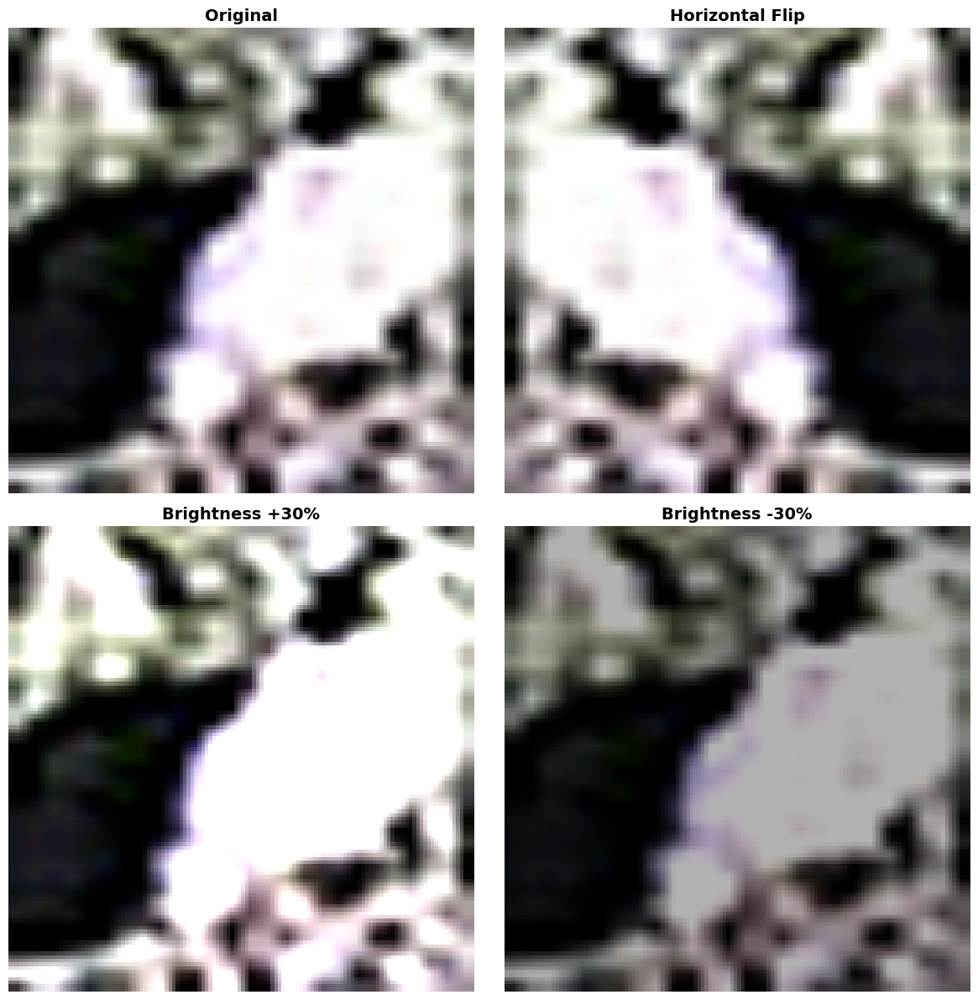

In [12]:
print("\nVISUALIZING DATA AUGMENTATION")

def visualize_augmentation(patches):
    """Show data augmentation examples"""
    if not patches:
        print("No patches to augment")
        return

    sample_patch = patches[0]

    augmentations = []
    augmentation_names = []

    # Original
    augmentations.append(sample_patch)
    augmentation_names.append("Original")

    # Augmentations
    augmentations.append(cv2.flip(sample_patch, 1))
    augmentation_names.append("Horizontal Flip")

    augmentations.append(cv2.convertScaleAbs(sample_patch, alpha=1.3))
    augmentation_names.append("Brightness +30%")

    augmentations.append(cv2.convertScaleAbs(sample_patch, alpha=0.7))
    augmentation_names.append("Brightness -30%")

    # Display
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes = axes.ravel()

    for i, (aug, name) in enumerate(zip(augmentations, augmentation_names)):
        axes[i].imshow(cv2.cvtColor(aug, cv2.COLOR_BGR2RGB))
        axes[i].set_title(name, fontsize=14, fontweight='bold')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

if 'patches' in locals() and patches:
    visualize_augmentation(patches)

###HOG Feature Extraction

In [13]:
def extract_hog_features(patches, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9):
    """Extract HOG features from normalized patches"""
    if not patches:
        return np.array([])

    hog_features = []

    print("Extracting HOG features...")

    for patch in tqdm(patches, desc="HOG processing"):
        # Normalize patch first
        normalized = normalize_patch(patch)

        # Extract HOG features
        features = feature.hog(
            normalized,
            orientations=orientations,
            pixels_per_cell=pixels_per_cell,
            cells_per_block=cells_per_block,
            transform_sqrt=True,
            feature_vector=True
        )
        hog_features.append(features)

    return np.array(hog_features)

print("HOG Feature Extraction - Ready")

HOG Feature Extraction - Ready



VISUALIZING HOG FEATURES


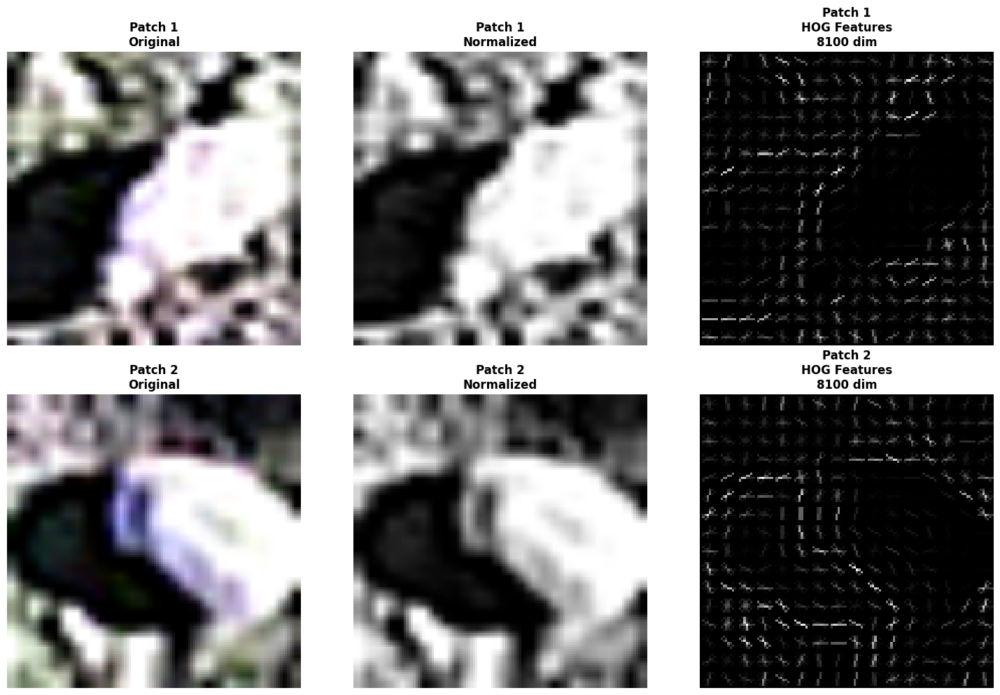

HOG features extracted successfully!


In [14]:
print("\nVISUALIZING HOG FEATURES")

# Make sure feature is imported
from skimage import feature

def visualize_hog_features(patches):
    """Show HOG feature extraction"""
    if not patches:
        print("No patches for HOG features")
        return

    # Use first 2 patches for clarity
    sample_patches = patches[:2]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    for i, patch in enumerate(sample_patches):
        normalized = normalize_patch(patch)

        # Extract HOG features with visualization
        features, hog_image = feature.hog(
            normalized,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            transform_sqrt=True,
            visualize=True
        )

        # Original patch
        axes[i, 0].imshow(cv2.cvtColor(patch, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f'Patch {i+1}\nOriginal', fontweight='bold')
        axes[i, 0].axis('off')

        # Normalized patch
        axes[i, 1].imshow(normalized, cmap='gray')
        axes[i, 1].set_title(f'Patch {i+1}\nNormalized', fontweight='bold')
        axes[i, 1].axis('off')

        # HOG features
        axes[i, 2].imshow(hog_image, cmap='gray')
        axes[i, 2].set_title(f'Patch {i+1}\nHOG Features\n{len(features)} dim', fontweight='bold')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"HOG features extracted successfully!")

if 'patches' in locals() and patches:
    visualize_hog_features(patches)

###Complete Training Dataset Creation

In [15]:
def create_training_dataset(train_images, val_images=None, patch_size=(128, 128)):
    """Create complete training dataset with HOG features"""
    print("Creating complete training dataset...")

    # Extract patches from training images
    pos_patches, neg_patches = extract_patches_from_dataset(
        train_images, patch_size=patch_size, max_patches=5
    )

    print(f"Before augmentation: {len(pos_patches)} sheep, {len(neg_patches)} background")

    # Data augmentation
    pos_patches_aug = augment_patches(pos_patches, augmentation_factor=2)
    neg_patches_aug = augment_patches(neg_patches, augmentation_factor=2)

    print(f"After augmentation: {len(pos_patches_aug)} sheep, {len(neg_patches_aug)} background")

    # Combine all patches
    all_patches = pos_patches_aug + neg_patches_aug
    labels = [1] * len(pos_patches_aug) + [0] * len(neg_patches_aug)

    # Extract HOG features
    X = extract_hog_features(all_patches)
    y = np.array(labels)

    print(f"Final dataset: {X.shape[0]} samples, {X.shape[1]} features")
    print(f"Class balance: {np.sum(y==1)} sheep, {np.sum(y==0)} background")

    return X, y, all_patches

print("Complete Training Dataset - Ready")

Complete Training Dataset - Ready



VISUALIZING COMPLETE TRAINING DATASET CREATION
Testing complete dataset creation visualization...
Creating dataset from 10 training images...

EXTRACTING PATCHES...
Extracting patches from 10 images...


Processing images: 100%|██████████| 10/10 [00:00<00:00, 49.52it/s]


Extracted 19 sheep patches, 30 background patches


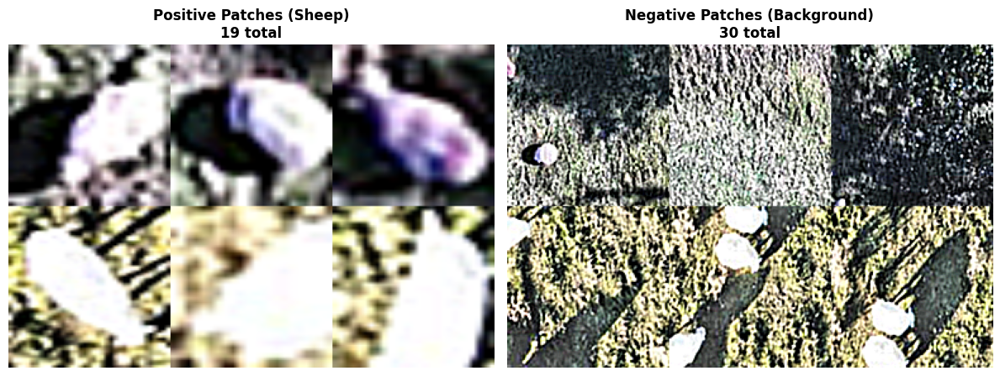

Patch extraction: 19 sheep, 30 background

APPLYING DATA AUGMENTATION...


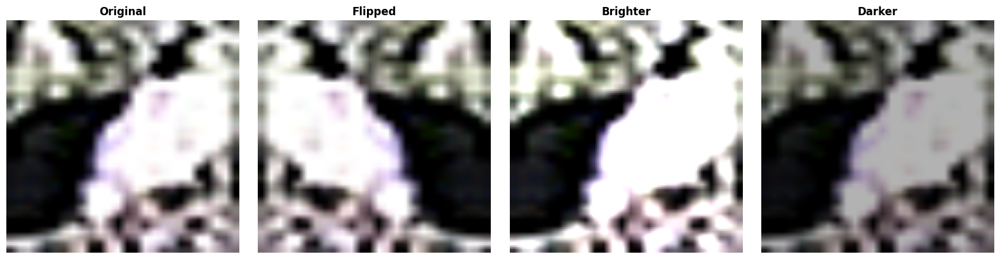

After augmentation: 57 sheep, 90 background

EXTRACTING HOG FEATURES...
Extracting HOG features...


HOG processing: 100%|██████████| 147/147 [00:01<00:00, 107.48it/s]


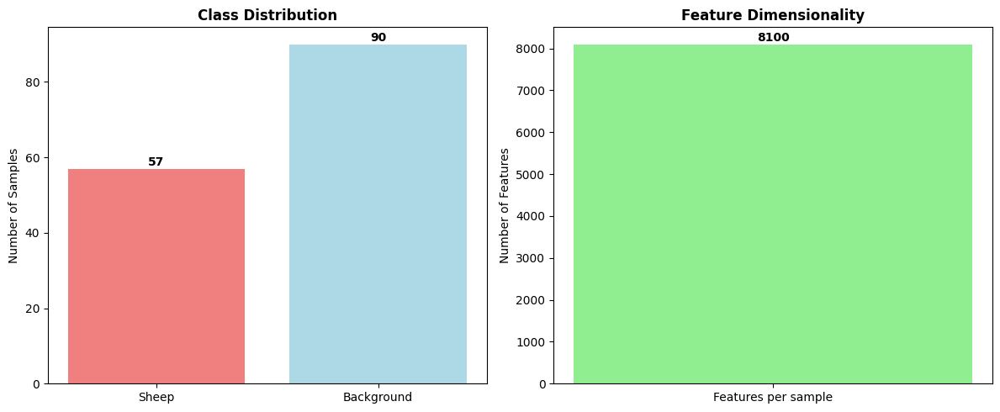

Final dataset: 147 samples, 8100 features
   - Sheep samples: 57
   - Background samples: 90


In [16]:
from tqdm import tqdm

print("\nVISUALIZING COMPLETE TRAINING DATASET CREATION")

def visualize_dataset_creation(train_images, patch_size=(128, 128)):
    """Show the complete dataset creation process with visualizations"""

    print(f"Creating dataset from {len(train_images)} training images...")

    # Step 1: Extract patches
    print("\nEXTRACTING PATCHES...")
    pos_patches, neg_patches = extract_patches_from_dataset(
        train_images[:20], patch_size=patch_size, max_patches=3  # Use subset for visualization
    )

    # Visualize patch distribution
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Show sample positive patches
    if pos_patches:
        pos_grid = np.zeros((patch_size[0]*2, patch_size[1]*3, 3), dtype=np.uint8)
        for i, patch in enumerate(pos_patches[:6]):
            row = i // 3
            col = i % 3
            pos_grid[row*patch_size[0]:(row+1)*patch_size[0],
                    col*patch_size[1]:(col+1)*patch_size[1]] = patch

        axes[0].imshow(cv2.cvtColor(pos_grid, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'Positive Patches (Sheep)\n{len(pos_patches)} total', fontweight='bold')
        axes[0].axis('off')
    else:
        axes[0].text(0.5, 0.5, 'No positive patches', ha='center', va='center', transform=axes[0].transAxes)
        axes[0].axis('off')

    # Show sample negative patches
    if neg_patches:
        neg_grid = np.zeros((patch_size[0]*2, patch_size[1]*3, 3), dtype=np.uint8)
        for i, patch in enumerate(neg_patches[:6]):
            row = i // 3
            col = i % 3
            neg_grid[row*patch_size[0]:(row+1)*patch_size[0],
                    col*patch_size[1]:(col+1)*patch_size[1]] = patch

        axes[1].imshow(cv2.cvtColor(neg_grid, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'Negative Patches (Background)\n{len(neg_patches)} total', fontweight='bold')
        axes[1].axis('off')
    else:
        axes[1].text(0.5, 0.5, 'No negative patches', ha='center', va='center', transform=axes[1].transAxes)
        axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Patch extraction: {len(pos_patches)} sheep, {len(neg_patches)} background")

    # Step 2: Data Augmentation
    print("\nAPPLYING DATA AUGMENTATION...")
    pos_patches_aug = augment_patches(pos_patches, augmentation_factor=2)
    neg_patches_aug = augment_patches(neg_patches, augmentation_factor=2)

    # Visualize augmentation
    if pos_patches:
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))

        # Show original and augmented versions of first patch
        original = pos_patches[0]
        augmented_samples = [
            original,
            cv2.flip(original, 1),
            cv2.convertScaleAbs(original, alpha=1.3),
            cv2.convertScaleAbs(original, alpha=0.7)
        ]
        aug_names = ['Original', 'Flipped', 'Brighter', 'Darker']

        for i, (aug, name) in enumerate(zip(augmented_samples, aug_names)):
            axes[i].imshow(cv2.cvtColor(aug, cv2.COLOR_BGR2RGB))
            axes[i].set_title(name, fontweight='bold')
            axes[i].axis('off')

        plt.tight_layout()
        plt.show()

    print(f"After augmentation: {len(pos_patches_aug)} sheep, {len(neg_patches_aug)} background")

    # Step 3: HOG Feature Extraction
    print("\nEXTRACTING HOG FEATURES...")
    all_patches = pos_patches_aug + neg_patches_aug
    labels = [1] * len(pos_patches_aug) + [0] * len(neg_patches_aug)

    X = extract_hog_features(all_patches)
    y = np.array(labels)

    # Visualize feature distribution
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Class distribution
    class_counts = [np.sum(y == 1), np.sum(y == 0)]
    class_labels = ['Sheep', 'Background']
    axes[0].bar(class_labels, class_counts, color=['lightcoral', 'lightblue'])
    axes[0].set_title('Class Distribution', fontweight='bold')
    axes[0].set_ylabel('Number of Samples')
    for i, count in enumerate(class_counts):
        axes[0].text(i, count + 0.1, str(count), ha='center', va='bottom', fontweight='bold')

    # Feature dimensionality
    axes[1].bar(['Features per sample'], [X.shape[1]], color='lightgreen')
    axes[1].set_title('Feature Dimensionality', fontweight='bold')
    axes[1].set_ylabel('Number of Features')
    axes[1].text(0, X.shape[1] + 5, str(X.shape[1]), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    print(f"Final dataset: {X.shape[0]} samples, {X.shape[1]} features")
    print(f"   - Sheep samples: {np.sum(y == 1)}")
    print(f"   - Background samples: {np.sum(y == 0)}")

    return X, y, all_patches

# Test the complete visualization
if len(train_images) > 0:
    print("Testing complete dataset creation visualization...")
    X_vis, y_vis, patches_vis = visualize_dataset_creation(train_images[:10])  # Small subset for testing

###Execute the Pipeline

In [17]:
print("EXECUTING COMPLETE PREPROCESSING PIPELINE")

# Use subset for testing (use full dataset later)
train_subset = train_images
print(f"Processing {len(train_subset)} training images")

# Create the complete training dataset
X_train, y_train, training_patches = create_training_dataset(train_subset)

# Save the processed data
np.save('X_train_hog.npy', X_train)
np.save('y_train_hog.npy', y_train)

print("\nPREPROCESSING PIPELINE COMPLETE")
print(f"Training data: {X_train.shape[0]} samples, {X_train.shape[1]} features")
print(f"Saved to: X_train_hog.npy, y_train_hog.npy")
print(f"Ready for SVM training!")

EXECUTING COMPLETE PREPROCESSING PIPELINE
Processing 2893 training images
Creating complete training dataset...
Extracting patches from 2893 images...


Processing images: 100%|██████████| 2893/2893 [00:40<00:00, 71.99it/s]


Extracted 6335 sheep patches, 14465 background patches
Before augmentation: 6335 sheep, 14465 background
After augmentation: 19005 sheep, 43395 background
Extracting HOG features...


HOG processing: 100%|██████████| 62400/62400 [09:17<00:00, 112.01it/s]


Final dataset: 62400 samples, 8100 features
Class balance: 19005 sheep, 43395 background

PREPROCESSING PIPELINE COMPLETE
Training data: 62400 samples, 8100 features
Saved to: X_train_hog.npy, y_train_hog.npy
Ready for SVM training!



FINAL OVERVIEW VISUALIZATION


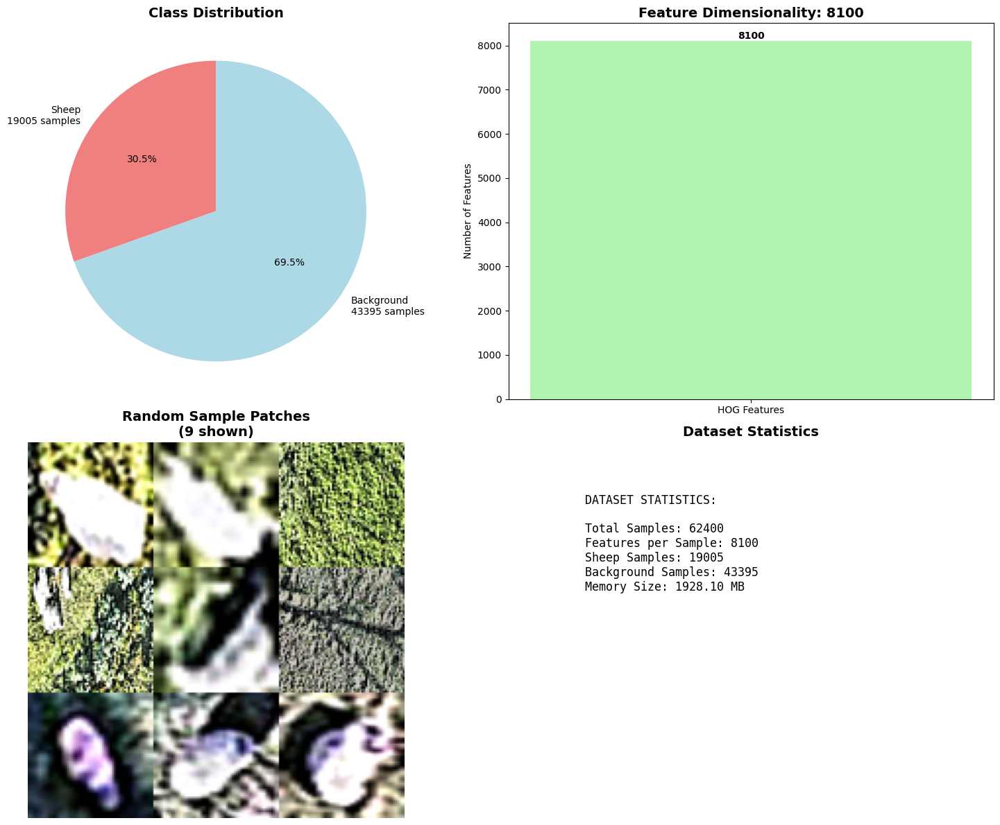

Final overview completed!


In [18]:
print("\nFINAL OVERVIEW VISUALIZATION")

def create_final_overview(X, y, patches):
    """Create a comprehensive overview of the final dataset"""

    if X.size == 0:
        print("No data to visualize")
        return

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Class distribution pie chart
    sheep_count = np.sum(y == 1)
    bg_count = np.sum(y == 0)
    sizes = [sheep_count, bg_count]
    labels = [f'Sheep\n{sheep_count} samples', f'Background\n{bg_count} samples']
    colors = ['lightcoral', 'lightblue']

    axes[0, 0].pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
    axes[0, 0].set_title('Class Distribution', fontweight='bold', fontsize=14)

    # 2. Feature dimensionality
    axes[0, 1].bar(['HOG Features'], [X.shape[1]], color='lightgreen', alpha=0.7)
    axes[0, 1].set_ylabel('Number of Features')
    axes[0, 1].set_title(f'Feature Dimensionality: {X.shape[1]}', fontweight='bold', fontsize=14)
    axes[0, 1].text(0, X.shape[1] + 5, str(X.shape[1]), ha='center', va='bottom', fontweight='bold')

    # 3. Sample patches grid
    if patches:
        # Show 9 random patches
        sample_indices = np.random.choice(len(patches), min(9, len(patches)), replace=False)
        grid_size = int(np.ceil(np.sqrt(len(sample_indices))))

        patch_grid = np.zeros((64*grid_size, 64*grid_size, 3), dtype=np.uint8)

        for idx, sample_idx in enumerate(sample_indices):
            row = idx // grid_size
            col = idx % grid_size
            patch_resized = cv2.resize(patches[sample_idx], (64, 64))
            patch_grid[row*64:(row+1)*64, col*64:(col+1)*64] = patch_resized

        axes[1, 0].imshow(cv2.cvtColor(patch_grid, cv2.COLOR_BGR2RGB))
        axes[1, 0].set_title(f'Random Sample Patches\n({len(sample_indices)} shown)', fontweight='bold', fontsize=14)
        axes[1, 0].axis('off')
    else:
        axes[1, 0].text(0.5, 0.5, 'No patches available', ha='center', va='center', transform=axes[1, 0].transAxes)
        axes[1, 0].axis('off')

    # 4. Dataset statistics
    stats_text = f"""
    DATASET STATISTICS:

    Total Samples: {X.shape[0]}
    Features per Sample: {X.shape[1]}
    Sheep Samples: {sheep_count}
    Background Samples: {bg_count}
    Memory Size: {(X.nbytes / 1024 / 1024):.2f} MB
    """

    axes[1, 1].text(0.1, 0.9, stats_text, fontsize=12, fontfamily='monospace',
                   verticalalignment='top', transform=axes[1, 1].transAxes)
    axes[1, 1].set_title('Dataset Statistics', fontweight='bold', fontsize=14)
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

    print("Final overview completed!")

# Create final overview
if 'X_train' in locals() and 'y_train' in locals():
    create_final_overview(X_train, y_train, training_patches)

##SVM Training

In [19]:
import seaborn as sns
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, average_precision_score
from sklearn.model_selection import cross_val_score
import pickle

# Set style for better plots
plt.style.use('default')
sns.set_palette("husl")

In [ ]:
def train_svm_with_validation(X_train, y_train):
    """Train SVM with proper validation strategy"""
    print("Training SVM classifier...")
    print(f"   Training data: {X_train.shape[0]} samples, {X_train.shape[1]} features")
    print(f"   Class distribution: {np.sum(y_train==1)} sheep, {np.sum(y_train==0)} background")

    # Initialize SVM with balanced class weights
    svm = LinearSVC(
        C=1.0,
        random_state=42,
        max_iter=10000,
        class_weight='balanced'  # Handle class imbalance
    )

    # Cross-validation to estimate performance
    print("   Performing cross-validation...")
    cv_scores = cross_val_score(svm, X_train, y_train, cv=5, scoring='accuracy')
    print(f"   Cross-validation accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

    # Train final model
    svm.fit(X_train, y_train)
    train_accuracy = svm.score(X_train, y_train)
    print(f"   Final training accuracy: {train_accuracy:.4f}")

    return svm, cv_scores

# Train the model
svm_classifier, cv_scores = train_svm_with_validation(X_train, y_train)

# Save the trained model
with open('svm_sheep_detector.pkl', 'wb') as f:
    pickle.dump(svm_classifier, f)
print("Model saved: svm_sheep_detector.pkl")

Training SVM classifier...
   Training data: 62400 samples, 8100 features
   Class distribution: 19005 sheep, 43395 background
   Performing cross-validation...


##Validate SVM and Threshold Tuning

In [ ]:
def validate_on_validation_set(svm, val_images, patch_size=(128, 128)):
    """Validate model and tune decision threshold"""
    print("Validating on validation set...")

    # Extract patches from validation set
    pos_val, neg_val = extract_patches_from_dataset(val_images, patch_size=patch_size, max_patches=5)

    if len(pos_val) == 0 or len(neg_val) == 0:
        print("Not enough validation patches")
        return None

    # Create validation dataset
    val_patches = pos_val + neg_val
    y_val_true = [1] * len(pos_val) + [0] * len(neg_val)
    X_val = extract_hog_features(val_patches)
    y_val_true = np.array(y_val_true)

    # Get decision scores for threshold tuning
    y_val_scores = svm.decision_function(X_val)
    y_val_pred = svm.predict(X_val)

    # Calculate metrics
    from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

    accuracy = accuracy_score(y_val_true, y_val_pred)
    precision = precision_score(y_val_true, y_val_pred)
    recall = recall_score(y_val_true, y_val_pred)
    f1 = f1_score(y_val_true, y_val_pred)

    print(f"Validation Results:")
    print(f"   Accuracy:  {accuracy:.4f}")
    print(f"   Precision: {precision:.4f}")
    print(f"   Recall:    {recall:.4f}")
    print(f"   F1-Score:  {f1:.4f}")
    print(f"   Samples: {len(y_val_true)} ({len(pos_val)} sheep, {len(neg_val)} background)")

    # Precision-Recall curve for threshold analysis
    precision_vals, recall_vals, thresholds = precision_recall_curve(y_val_true, y_val_scores)
    avg_precision = average_precision_score(y_val_true, y_val_scores)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(recall_vals, precision_vals, linewidth=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve\nAP = {avg_precision:.3f}')
    plt.grid(True, alpha=0.3)

    plt.subplot(1, 2, 2)
    # Find optimal threshold (maximizing F1)
    f1_scores = 2 * (precision_vals * recall_vals) / (precision_vals + recall_vals + 1e-8)
    optimal_idx = np.argmax(f1_scores)
    optimal_threshold = thresholds[optimal_idx] if optimal_idx < len(thresholds) else 0

    plt.plot(thresholds, f1_scores[:-1], linewidth=2)
    plt.axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimal: {optimal_threshold:.2f}')
    plt.xlabel('Decision Threshold')
    plt.ylabel('F1-Score')
    plt.title('Threshold vs F1-Score')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"Optimal decision threshold: {optimal_threshold:.3f}")

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'optimal_threshold': optimal_threshold,
        'ap': avg_precision
    }

# Run validation
if 'val_images' in locals() and len(val_images) > 0:
    validation_results = validate_on_validation_set(svm_classifier, val_images)
else:
    print("No validation set available")
    validation_results = None

##Test & Evaluation

###Tier 1 - Roboflow Test Set

In [ ]:
def tier1_evaluation_roboflow(svm, roboflow_test_images, optimal_threshold=0.0, patch_size=(128, 128)):
    """Comprehensive evaluation on Roboflow test set (same domain)"""
    print("Tier 1: Evaluating on Roboflow test set (same domain)...")

    # Extract test patches from Roboflow test split
    pos_test, neg_test = extract_patches_from_dataset(test_images, patch_size=patch_size, max_patches=5)

    if len(pos_test) == 0:
        print("No Roboflow test patches extracted")
        return None

    # Create test dataset
    test_patches = pos_test + neg_test
    y_test_true = [1] * len(pos_test) + [0] * len(neg_test)
    X_test = extract_hog_features(test_patches)
    y_test_true = np.array(y_test_true)

    # Predict with optimal threshold
    y_test_scores = svm.decision_function(X_test)
    y_test_pred = (y_test_scores > optimal_threshold).astype(int)

    # Comprehensive metrics
    from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score

    accuracy = accuracy_score(y_test_true, y_test_pred)
    precision = precision_score(y_test_true, y_test_pred, zero_division=0)
    recall = recall_score(y_test_true, y_test_pred, zero_division=0)
    f1 = f1_score(y_test_true, y_test_pred, zero_division=0)
    auc = roc_auc_score(y_test_true, y_test_scores)

    print(f"Tier 1 Results (Roboflow - Same Domain):")
    print(f"   Accuracy:    {accuracy:.4f}")
    print(f"   Precision:   {precision:.4f}")
    print(f"   Recall:      {recall:.4f}")
    print(f"   F1-Score:    {f1:.4f}")
    print(f"   AUC:         {auc:.4f}")
    print(f"   Test samples: {len(y_test_true)} ({len(pos_test)} sheep, {len(neg_test)} background)")

    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Confusion Matrix
    cm = confusion_matrix(y_test_true, y_test_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Background', 'Sheep'],
                yticklabels=['Background', 'Sheep'])
    axes[0].set_title('Confusion Matrix\n(Tier 1 - Roboflow Same Domain)')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')

    # Metrics comparison
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    scores = [accuracy, precision, recall, f1]

    bars = axes[1].bar(metrics, scores, color=['skyblue', 'lightcoral', 'lightgreen', 'gold'])
    axes[1].set_ylim(0, 1)
    axes[1].set_title('Performance Metrics\n(Tier 1 - Roboflow)')
    axes[1].set_ylabel('Score')

    # Add value labels
    for bar, score in zip(bars, scores):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                    f'{score:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'auc': auc,
        'n_samples': len(y_test_true),
        'dataset': 'Roboflow'
    }

# Run Tier 1 evaluation on Roboflow test set
if 'test_images' in locals() and len(test_images) > 0:
    optimal_threshold = validation_results['optimal_threshold'] if validation_results else 0.0
    tier1_results = tier1_evaluation_roboflow(svm_classifier, test_images, optimal_threshold)
else:
    print("No Roboflow test set available for Tier 1 evaluation")
    # If no separate test split, use part of Roboflow training data for demo
    if 'train_images' in locals() and len(train_images) > 0:
        print("   Using Roboflow training subset for Tier 1 demo...")
        tier1_demo = train_images
        tier1_results = tier1_evaluation_roboflow(svm_classifier, tier1_demo, optimal_threshold)
    else:
        tier1_results = None

###Tier 2 - Kaggle Dataset

In [ ]:
def tier2_evaluation_kaggle(svm, kaggle_images, optimal_threshold=0.0, patch_size=(64, 64), max_images=100):
    """Evaluate generalization on Kaggle dataset (different domain)"""
    print("Tier 2: Evaluating on Kaggle dataset (cross-domain)...")

    # Use subset for reasonable computation time
    kaggle_subset = kaggle_images
    print(f"   Using {len(kaggle_subset)} Kaggle images...")

    # Extract patches from Kaggle (different domain)
    pos_kaggle, neg_kaggle = extract_patches_from_dataset(
        kaggle_subset, patch_size=patch_size, max_patches=3
    )

    if len(pos_kaggle) == 0:
        print("No Kaggle patches extracted")
        return None

    # Create test dataset
    kaggle_patches = pos_kaggle + neg_kaggle
    y_kaggle_true = [1] * len(pos_kaggle) + [0] * len(neg_kaggle)
    X_kaggle = extract_hog_features(kaggle_patches)
    y_kaggle_true = np.array(y_kaggle_true)

    if X_kaggle.size == 0:
        print("No features extracted from Kaggle dataset")
        return None

    # Predict with optimal threshold
    y_kaggle_scores = svm.decision_function(X_kaggle)
    y_kaggle_pred = (y_kaggle_scores > optimal_threshold).astype(int)

    # Comprehensive metrics
    from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score

    accuracy = accuracy_score(y_kaggle_true, y_kaggle_pred)
    precision = precision_score(y_kaggle_true, y_kaggle_pred, zero_division=0)
    recall = recall_score(y_kaggle_true, y_kaggle_pred, zero_division=0)
    f1 = f1_score(y_kaggle_true, y_kaggle_pred, zero_division=0)
    auc = roc_auc_score(y_kaggle_true, y_kaggle_scores)

    print(f"Tier 2 Results (Kaggle - Cross-Domain):")
    print(f"   Accuracy:    {accuracy:.4f}")
    print(f"   Precision:   {precision:.4f}")
    print(f"   Recall:      {recall:.4f}")
    print(f"   F1-Score:    {f1:.4f}")
    print(f"   AUC:         {auc:.4f}")
    print(f"   Test samples: {len(y_kaggle_true)} ({len(pos_kaggle)} sheep, {len(neg_kaggle)} background)")

    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Confusion Matrix
    cm = confusion_matrix(y_kaggle_true, y_kaggle_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', ax=axes[0],
                xticklabels=['Background', 'Sheep'],
                yticklabels=['Background', 'Sheep'])
    axes[0].set_title('Confusion Matrix\n(Tier 2 - Kaggle Cross Domain)')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')

    # Metrics comparison
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    scores = [accuracy, precision, recall, f1]

    bars = axes[1].bar(metrics, scores, color=['lightcoral', 'lightblue', 'lightgreen', 'gold'])
    axes[1].set_ylim(0, 1)
    axes[1].set_title('Performance Metrics\n(Tier 2 - Kaggle)')
    axes[1].set_ylabel('Score')

    # Add value labels
    for bar, score in zip(bars, scores):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                    f'{score:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'auc': auc,
        'n_samples': len(y_kaggle_true),
        'dataset': 'Kaggle'
    }

# Run Tier 2 evaluation on Kaggle dataset
if 'kaggle_images' in locals() and len(kaggle_images) > 0:
    optimal_threshold = validation_results['optimal_threshold'] if validation_results else 0.0
    tier2_results = tier2_evaluation_kaggle(svm_classifier, kaggle_images, optimal_threshold)
else:
    print("No Kaggle dataset available for Tier 2 evaluation")
    tier2_results = None

##Analysis

In [ ]:
def comprehensive_analysis_corrected(tier1_results, tier2_results, validation_results):
    """Comprehensive performance analysis with correct dataset assignments"""
    print("Comprehensive Performance Analysis")
    print("   Tier 1: Roboflow (Same Domain)")
    print("   Tier 2: Kaggle (Cross Domain)")

    # Create comparison plot
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Main metrics comparison
    if tier1_results and tier2_results:
        metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
        tier1_scores = [tier1_results['accuracy'], tier1_results['precision'],
                       tier1_results['recall'], tier1_results['f1']]
        tier2_scores = [tier2_results['accuracy'], tier2_results['precision'],
                       tier2_results['recall'], tier2_results['f1']]

        x = np.arange(len(metrics))
        width = 0.35

        bars1 = axes[0, 0].bar(x - width/2, tier1_scores, width, label='Tier 1 (Roboflow)', alpha=0.8, color='blue')
        bars2 = axes[0, 0].bar(x + width/2, tier2_scores, width, label='Tier 2 (Kaggle)', alpha=0.8, color='red')

        axes[0, 0].set_xlabel('Metrics')
        axes[0, 0].set_ylabel('Scores')
        axes[0, 0].set_title('Performance: Same Domain vs Cross Domain', fontweight='bold', fontsize=14)
        axes[0, 0].set_xticks(x)
        axes[0, 0].set_xticklabels(metrics)
        axes[0, 0].legend()
        axes[0, 0].set_ylim(0, 1)
        axes[0, 0].grid(True, alpha=0.3)

        # Add value labels
        for bar in bars1:
            height = bar.get_height()
            axes[0, 0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                           f'{height:.3f}', ha='center', va='bottom', fontsize=10)

        for bar in bars2:
            height = bar.get_height()
            axes[0, 0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                           f'{height:.3f}', ha='center', va='bottom', fontsize=10)

    # 2. Performance drop analysis
    if tier1_results and tier2_results:
        performance_drop = [
            tier1_results['accuracy'] - tier2_results['accuracy'],
            tier1_results['precision'] - tier2_results['precision'],
            tier1_results['recall'] - tier2_results['recall'],
            tier1_results['f1'] - tier2_results['f1']
        ]

        bars = axes[0, 1].bar(metrics, performance_drop,
                             color=['red' if x > 0.1 else 'orange' if x > 0.05 else 'yellow' for x in performance_drop])
        axes[0, 1].set_title('Domain Shift Impact\n(Roboflow - Kaggle)', fontweight='bold', fontsize=14)
        axes[0, 1].set_ylabel('Performance Drop')
        axes[0, 1].grid(True, alpha=0.3)

        for bar, drop in zip(bars, performance_drop):
            color = 'red' if drop > 0 else 'green'
            axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.005 if drop > 0 else -0.02),
                           f'{drop:+.3f}', ha='center', va='bottom' if drop > 0 else 'top',
                           fontweight='bold', color=color)

    # 3. Summary statistics
    summary_text = "HOG+SVM DETECTION SUMMARY\n\n"
    summary_text += "DATASET STRATEGY:\n"
    summary_text += "• Train: Roboflow (4133 images)\n"
    summary_text += "• Tier 1: Roboflow Test (Same Domain)\n"
    summary_text += "• Tier 2: Kaggle (Cross Domain)\n\n"

    if validation_results:
        summary_text += f"VALIDATION (Roboflow):\n"
        summary_text += f"F1-Score: {validation_results['f1']:.3f}\n"
        summary_text += f"AP: {validation_results['ap']:.3f}\n\n"

    if tier1_results:
        summary_text += f"TIER 1 (ROBOFLOW):\n"
        summary_text += f"F1-Score: {tier1_results['f1']:.3f}\n"
        summary_text += f"AUC: {tier1_results['auc']:.3f}\n"
        summary_text += f"Samples: {tier1_results['n_samples']}\n\n"

    if tier2_results:
        summary_text += f"TIER 2 (KAGGLE):\n"
        summary_text += f"F1-Score: {tier2_results['f1']:.3f}\n"
        summary_text += f"AUC: {tier2_results['auc']:.3f}\n"
        summary_text += f"Samples: {tier2_results['n_samples']}\n"

    axes[1, 0].text(0.1, 0.9, summary_text, fontsize=11, fontfamily='monospace',
                   verticalalignment='top', transform=axes[1, 0].transAxes)
    axes[1, 0].set_title('Dataset Strategy & Results', fontweight='bold', fontsize=14)
    axes[1, 0].axis('off')

    # 4. Generalization analysis
    if tier1_results and tier2_results:
        generalization_gap = tier1_results['f1'] - tier2_results['f1']
        generalization_strength = "EXCELLENT" if generalization_gap < 0.1 else "GOOD" if generalization_gap < 0.2 else "POOR"

        analysis_text = f"GENERALIZATION ANALYSIS:\n\n"
        analysis_text += f"F1 Gap (Roboflow→Kaggle): {generalization_gap:.3f}\n"
        analysis_text += f"Generalization: {generalization_strength}\n\n"

        if generalization_gap < 0.1:
            analysis_text += "Excellent generalization!\nModel trained on Roboflow works\nvery well on Kaggle data."
        elif generalization_gap < 0.2:
            analysis_text += "Good generalization.\nModel works reasonably well\non different domain."
        else:
            analysis_text += "Poor generalization.\nModel overfitted to Roboflow\ndomain characteristics."

        axes[1, 1].text(0.1, 0.9, analysis_text, fontsize=11, fontfamily='monospace',
                       verticalalignment='top', transform=axes[1, 1].transAxes,
                       bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.7))
        axes[1, 1].set_title('Cross-Domain Generalization', fontweight='bold', fontsize=14)
        axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

    # Print final summary
    print("FINAL PERFORMANCE SUMMARY")
    print("DATASET STRATEGY:")
    print("  • Training: Roboflow (70/15/15 split)")
    print("  • Tier 1:   Roboflow Test (Same Domain)")
    print("  • Tier 2:   Kaggle (Cross Domain)")
    print()

    if tier1_results:
        print(f"Tier 1 (Roboflow - Same Domain): F1 = {tier1_results['f1']:.3f}")
    if tier2_results:
        print(f"Tier 2 (Kaggle - Cross Domain):   F1 = {tier2_results['f1']:.3f}")
    if tier1_results and tier2_results:
        generalization_gap = tier1_results['f1'] - tier2_results['f1']
        print(f"Generalization Gap (Roboflow→Kaggle): {generalization_gap:+.3f}")

        if generalization_gap < 0.1:
            print("EXCELLENT: Model generalizes very well to different domain!")
        elif generalization_gap < 0.2:
            print("GOOD: Model shows reasonable cross-domain performance")
        else:
            print("POOR: Model overfitted to training domain")

# Run comprehensive analysis with correct datasets
comprehensive_analysis_corrected(tier1_results, tier2_results, validation_results)